# Import Libraries

In [45]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")

# Load Data 

In [3]:
df = pd.read_csv('loan_approval_dataset.csv')
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


# Generate EDA with yprofiling

In [ ]:
#!pip install ydata-profiling

In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Loan approval Prediction", explorative=True)
# Display in Jupyter notebook
profile.to_notebook_iframe()
# Save EDA as HTML
profile.to_file("LoanApprovaPredictionEDA.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 61.01it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Train Test Splitting

In [4]:
df.columns = df.columns.str.replace(" ", "")

In [5]:
X = df.drop(columns=["loan_status"])
Y = df["loan_status"]
X_train, X_test, y_train , y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Visualization

In [ ]:
num_cols = X_train.select_dtypes(include=["int64", "float64"]).columns.tolist()
cat_cols = X_train.select_dtypes(include=["object", "category"]).columns.tolist()
target = "loan_status"

## Univariate Analysis

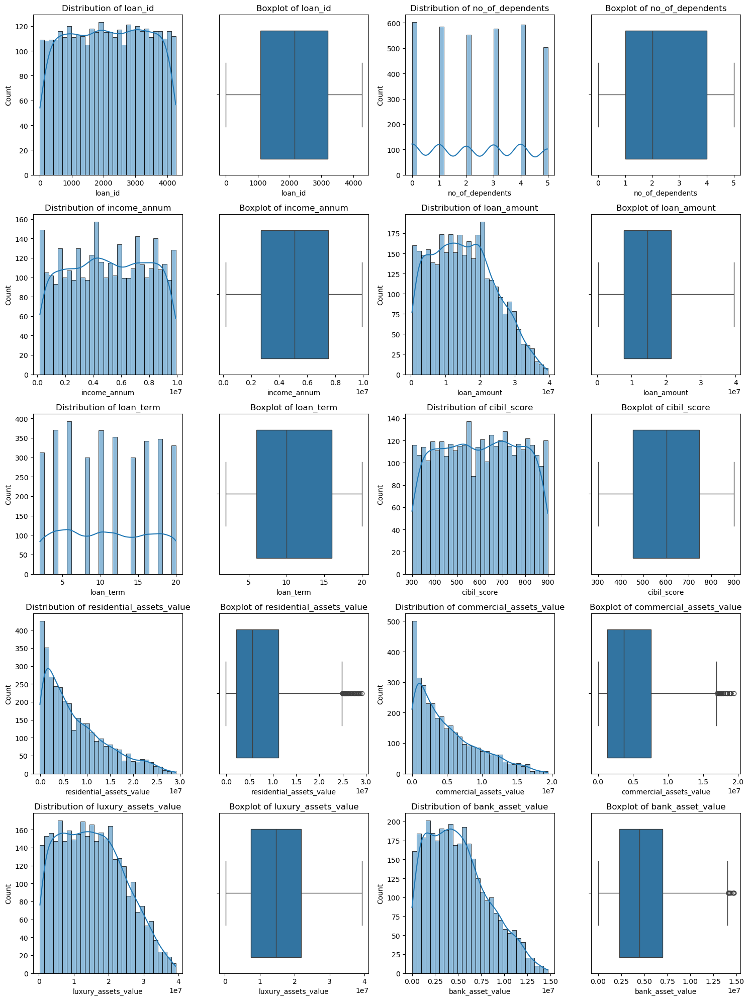

In [60]:
# Visualize Numerical Columns
plots_per_row = 4
n = len(num_cols) * 2   
rows = math.ceil(n / plots_per_row)

fig, axes = plt.subplots(rows, plots_per_row, figsize=(15, 4*rows))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    # Histogram
    sns.histplot(X_train[col], kde=True, bins=30, ax=axes[2*i])
    axes[2*i].set_title(f"Distribution of {col}")
    
    # Boxplot
    sns.boxplot(x=X_train[col], ax=axes[2*i+1])
    axes[2*i+1].set_title(f"Boxplot of {col}")

# Hide unused subplots
for j in range(2*len(num_cols), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

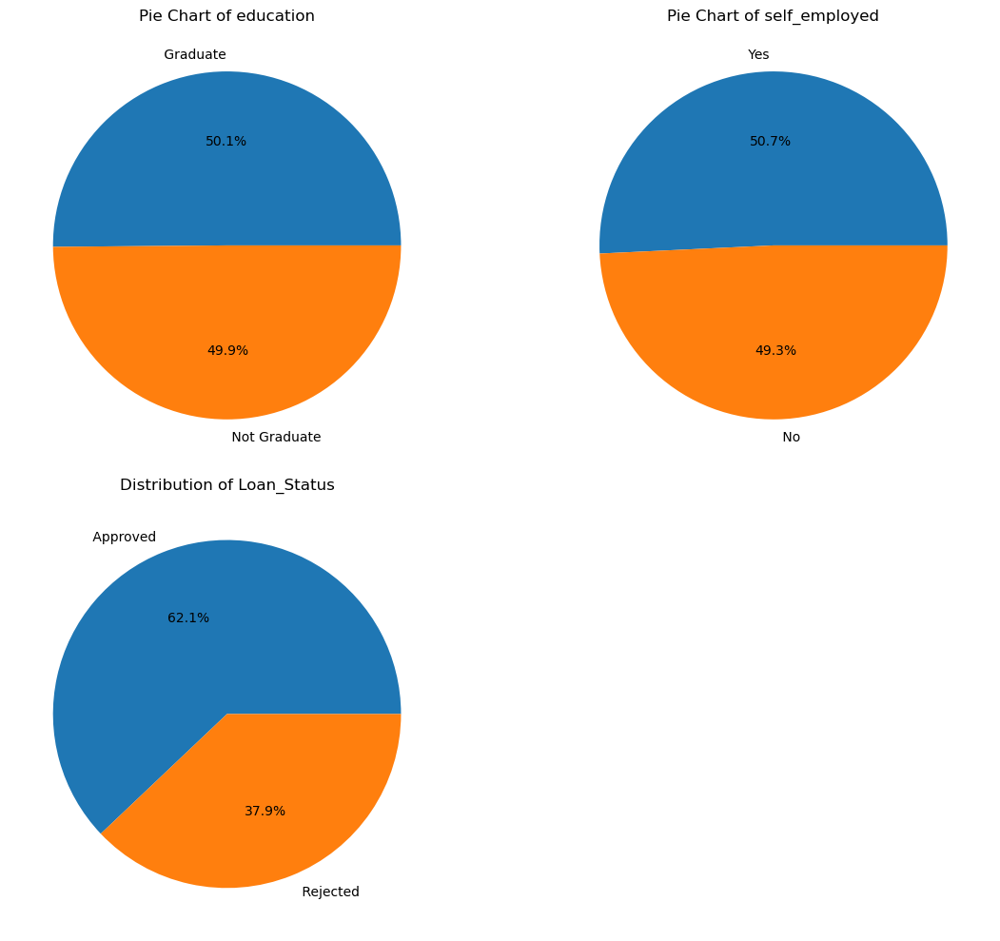

In [64]:
# Visualize Categorical Columns 
all_cats = cat_cols + [target]   
plots_per_row = 2
rows = math.ceil(len(all_cats) / plots_per_row)

fig, axes = plt.subplots(rows, plots_per_row, figsize=(12, 5*rows))
axes = axes.flatten()

for i, col in enumerate(all_cats):
    if col == target:
        y_train.value_counts().plot.pie(autopct="%1.1f%%", ax=axes[i])
        axes[i].set_title("Distribution of Loan_Status")
    else:
        X_train[col].value_counts().plot.pie(autopct="%1.1f%%", ax=axes[i])
        axes[i].set_title(f"Pie Chart of {col}")
    axes[i].set_ylabel("")

# Hide unused axes
for j in range(len(all_cats), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

## Bivariate Analysis

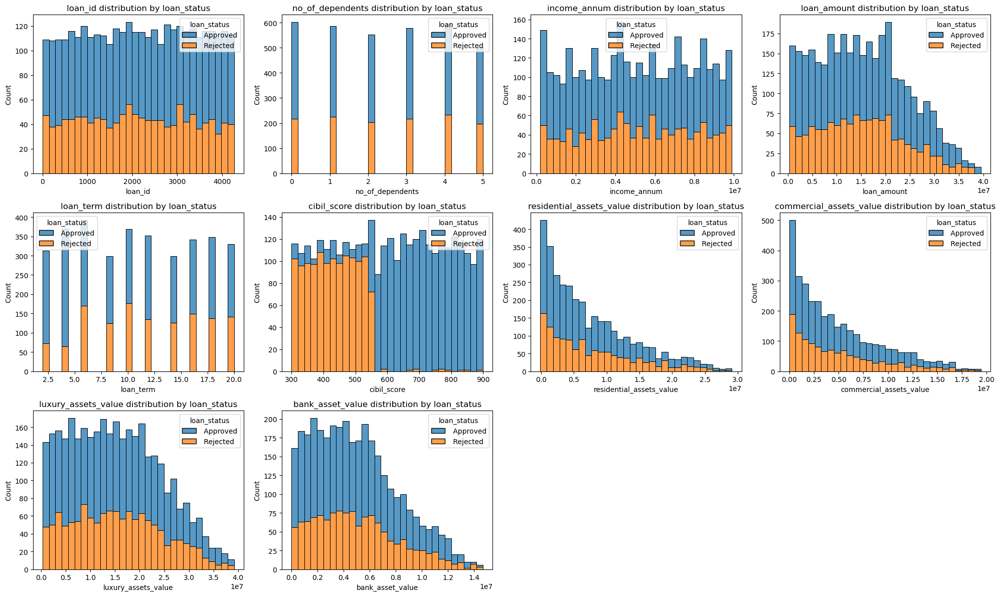

In [61]:
# Numerical Columns vs Target Variable
plots_per_row = 4
rows = math.ceil(len(num_cols) / plots_per_row)

fig, axes = plt.subplots(rows, plots_per_row, figsize=(20, 4*rows))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(data=X_train, x=col, hue=y_train, multiple="stack", bins=30, ax=axes[i])
    axes[i].set_title(f"{col} distribution by {target}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")

# Hide unused subplots
for j in range(len(num_cols), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

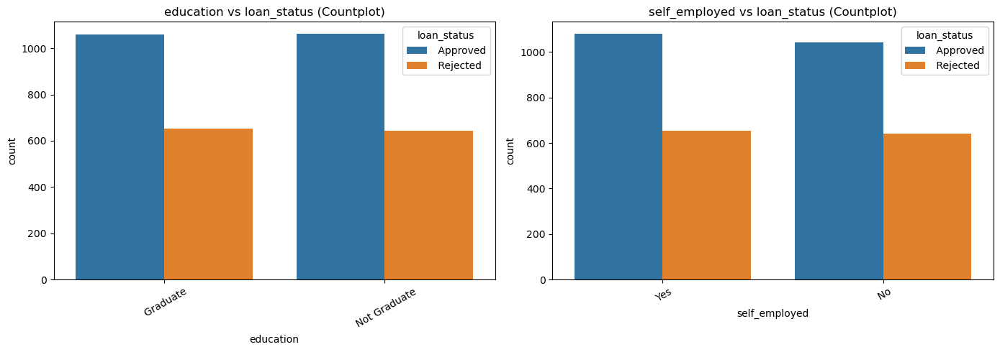

In [62]:
# Catregorical Columns vs Target Variable
plots_per_row = 2
rows = math.ceil(len([col for col in cat_cols if col != target]) / plots_per_row)

fig, axes = plt.subplots(rows, plots_per_row, figsize=(14, 5*rows))
axes = axes.flatten()

for i, col in enumerate([col for col in cat_cols if col != target]):
    sns.countplot(
        x=col, hue=y_train, data=X_train, 
        order=X_train[col].value_counts().index, 
        ax=axes[i]
    )
    axes[i].set_title(f"{col} vs {target} (Countplot)")
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=30)

# Hide unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

## Multivariate Analysis

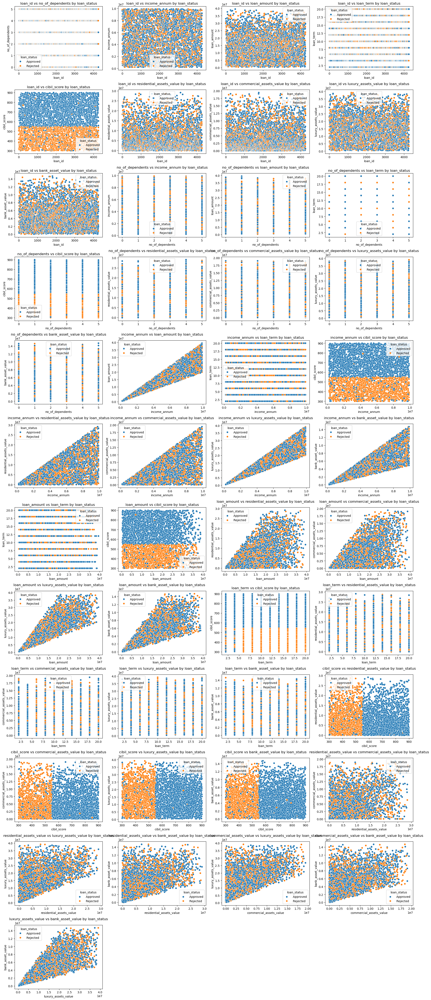

In [46]:
# Numerical vs Numerical
num_pairs = [(num_cols[i], num_cols[j]) for i in range(len(num_cols)) for j in range(i+1, len(num_cols))]

nrows = math.ceil(len(num_pairs)/4)
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(20, nrows*4))
axes = axes.flatten()

for i, (col1, col2) in enumerate(num_pairs):
    sns.scatterplot(x=col1, y=col2, hue=target, data=df, ax=axes[i])
    axes[i].set_title(f"{col1} vs {col2} by {target}")

for j in range(i+1, nrows*4):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

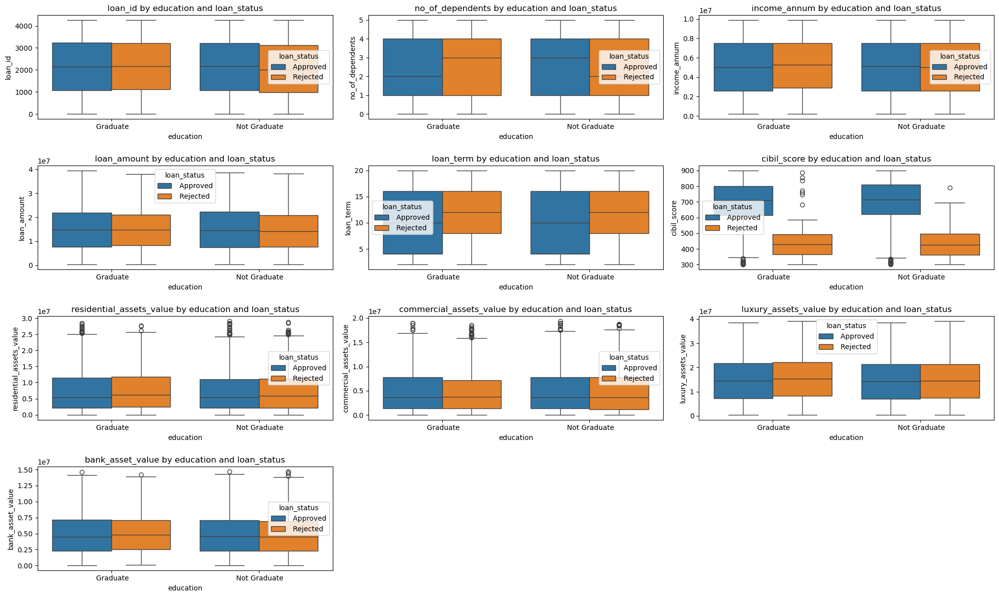

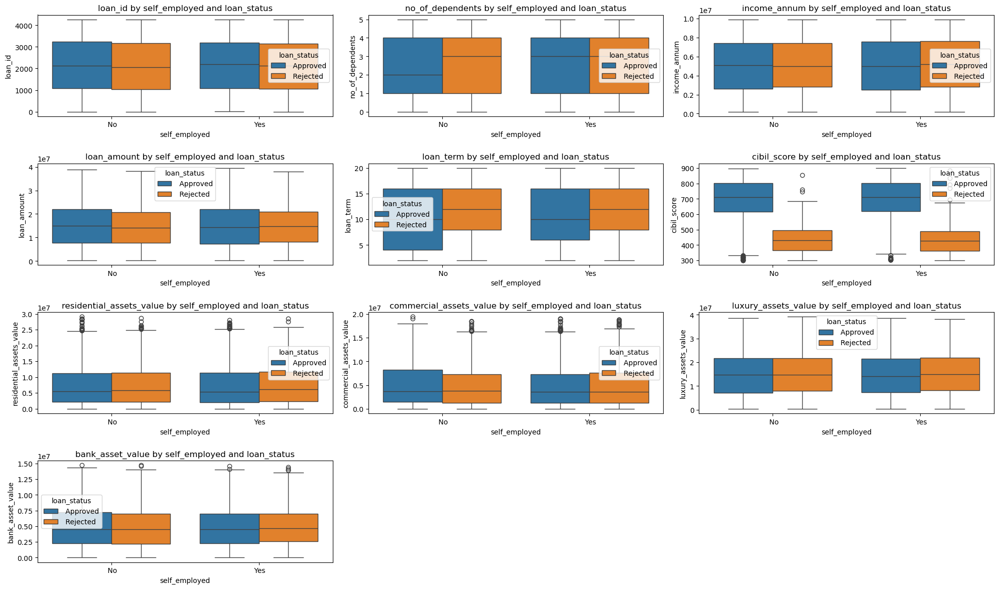

In [48]:
# Numerical vs Categorical
for cat in cat_cols:
    nrows = math.ceil(len(num_cols)/3)
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(20, nrows*3))
    axes = axes.flatten()

    for i, num in enumerate(num_cols):
        if num == target:
            continue
        sns.boxplot(x=cat, y=num, hue=target, data=df, ax=axes[i])
        axes[i].set_title(f"{num} by {cat} and {target}")

    for j in range(i+1, nrows*3):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

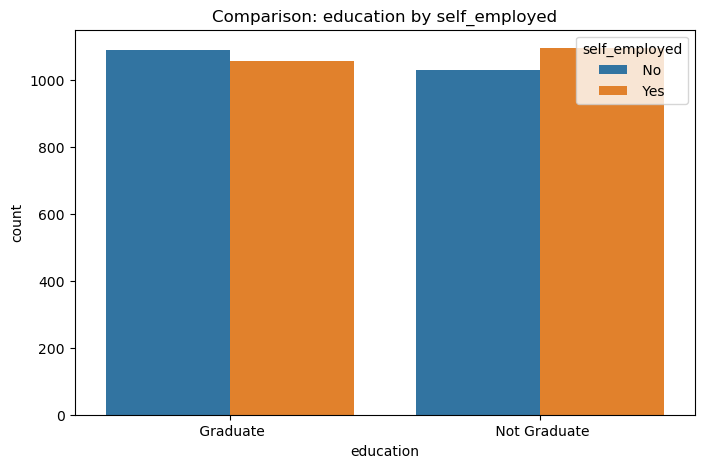

In [ ]:
# Categorical Columns vs Categorical Columns
for i, cat1 in enumerate(cat_cols):
    for cat2 in cat_cols[i+1:]:  
        plt.figure(figsize=(8,5))
        sns.countplot(x=cat1, hue=cat2, data=df)
        plt.title(f"Comparison: {cat1} by {cat2}")
        plt.show()

# Load Data into Files 

In [65]:
df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

df_train.to_csv("train_data.csv", index=False)
df_test.to_csv("test_data.csv", index=False)